In [1]:
import sys
import os

import numpy as np
import pandas as pd

In [ ]:
database_directory = r'C:\Users\khaled.ghobashy\Desktop\smbd\examples\notebooks\fsae_car'
pkg_path = r'C:\Users\khaled.ghobashy\Desktop\smbd'
sys.path.append(pkg_path)

In [2]:
database_directory = '/home/khaledghobashy/Documents/smbd/examples/notebooks/fsae_car'
pkg_path = '/home/khaledghobashy/Documents/smbd'
sys.path.append(pkg_path)

In [3]:
from smbd.numenv.python.numerics.systems import multibody_system, simulation
from smbd.utilities.numerics.euler_parameters import A

In [4]:
try:
    import fsae_car
except ModuleNotFoundError:
    import sys
    sys.path.append('/home/khaledghobashy/Documents/smbd/examples/notebooks')

In [5]:
from fsae_car.numenv.python.templates.dwb_bc_pushrod import dwb_bc_pushrod_cfg
from fsae_car.numenv.python.templates.steering_rack import steering_rack_cfg
from fsae_car.numenv.python.templates.chassis import chassis_cfg


In [6]:
from fsae_car.numenv.python.assemblies import rolling_chassis as assembly
num_model = multibody_system(assembly)

In [7]:
AX1_config = dwb_bc_pushrod_cfg.configuration()
AX2_config = dwb_bc_pushrod_cfg.configuration()
ST1_config = steering_rack_cfg.configuration()
CH_config  = chassis_cfg.configuration()

num_model.Subsystems.AX1.config = AX1_config
num_model.Subsystems.AX2.config = AX2_config
num_model.Subsystems.ST1.config = ST1_config
num_model.Subsystems.CH.config  = CH_config

In [8]:
configuration_files = os.path.join(database_directory, 'symenv', 'templates', 'config_inputs')

AX1_df = pd.read_csv(os.path.join(configuration_files, 'dwb_bc_pushrod_cfg.csv'), index_col=0)
AX2_df = pd.read_csv(os.path.join(configuration_files, 'dwb_bc_pushrod_cfg.csv'), index_col=0)
ST1_df = pd.read_csv(os.path.join(configuration_files, 'steering_rack_cfg.csv') , index_col=0)
CH_df  = pd.read_csv(os.path.join(configuration_files, 'chassis_cfg.csv'), index_col=0)

In [9]:
WB = 1600
TR = 254

## AX1 Configuration Data

In [10]:
# Upper Control Arms
AX1_df.loc['hpr_ucaf'] = [-235, 213, 89 + TR, 0]
AX1_df.loc['hpr_ucar'] = [ 170, 262, 61 + TR, 0]
AX1_df.loc['hpr_ucao'] = [   7, 466, 80 + TR, 0]

# Lower Control Arms
AX1_df.loc['hpr_lcaf'] = [-235, 213, -90 + TR, 0]
AX1_df.loc['hpr_lcar'] = [ 170, 262, -62 + TR, 0]
AX1_df.loc['hpr_lcao'] = [  -7, 483, -80 + TR, 0]

# Tie-Rod
AX1_df.loc['hpr_tri'] = [-122, 227, -122 + TR, 0]
AX1_df.loc['hpr_tro'] = [-122, 456, -132 + TR, 0]

# Push-Rod
AX1_df.loc['hpr_pushrod_rocker'] = [ 6.6, 347, 341 + TR, 0]
AX1_df.loc['hpr_pushrod_uca'] = [ 6.5, 412, 106 + TR, 0]

# Bell-Crank
AX1_df.loc['hpr_rocker_chassis'] = [ 6.5, 280, 320 + TR, 0]

# Struts
AX1_df.loc['hpr_strut_chassis'] = [ 6.5, 22.5, 377 + TR, 0]
AX1_df.loc['hpr_strut_rocker']  = [ 6.5, 263, 399 + TR, 0]
AX1_df.loc['far_strut_FL'] = [ 255, 0, 0, 0]


# Wheel-Hub
AX1_df.loc['hpr_wc']  = [0, 575, 0 + TR, 0]
AX1_df.loc['hpr_wc1'] = [0, 600, 0 + TR, 0]
AX1_df.loc['hpr_wc2'] = [0, 550, 0 + TR, 0]
AX1_df.loc['pt1_far_tire'] = AX1_df.loc['hpr_wc']


AX1_df.loc['vcs_x'] = [1, 0, 0, 0]
AX1_df.loc['vcs_y'] = [0, 1, 0, 0]
AX1_df.loc['vcs_z'] = [0, 0, 1, 0]

# Geometry Scalars
AX1_df.loc['s_tire_radius'] = [TR, 0, 0, 0]
AX1_df.loc['s_links_ro']    = [8, 0, 0, 0]
AX1_df.loc['s_strut_inner'] = [15, 0, 0, 0]
AX1_df.loc['s_strut_outer'] = [30, 0, 0, 0]
AX1_df.loc['s_thickness']   = [8, 0, 0, 0]

AX1_df.to_csv('config_inputs/front_axle.csv', index=True)


wheel_inertia =  np.array([[1*1e4, 0,      0 ],
                           [0    , 1*1e9, 0 ],
                           [0    , 0, 1*1e4  ]])

AX1_config.Jbar_rbr_hub = wheel_inertia
AX1_config.Jbar_rbl_hub = wheel_inertia

AX1_config.m_rbr_hub = 11*1e3
AX1_config.m_rbl_hub = 11*1e3

# Loading data into the configuration instance
AX1_config.load_from_dataframe(AX1_df)

## AX2 Configuration Data

In [11]:
# Upper Control Arms
AX2_df.loc['hpr_ucaf'] = [ -60 + WB, 250, 52 + TR, 0]
AX2_df.loc['hpr_ucar'] = [-247 + WB, 276, 25 + TR, 0]
AX2_df.loc['hpr_ucao'] = [   0 + WB, 462, 90 + TR, 0]

# Lower Control Arms
AX2_df.loc['hpr_lcaf'] = [ -60 + WB, 250, -84 + TR, 0]
AX2_df.loc['hpr_lcar'] = [-202 + WB, 269, -79 + TR, 0]
AX2_df.loc['hpr_lcao'] = [   0 + WB, 462, -90 + TR, 0]

# Tie-Rod
AX2_df.loc['hpr_tri'] = [-247 + WB, 276, -77 + TR, 0]
AX2_df.loc['hpr_tro'] = [-314 + WB, 462, -90 + TR, 0]

# Push-Rod
AX2_df.loc['hpr_pushrod_rocker'] = [-65 + WB, 336, 207 + TR, 0]
AX2_df.loc['hpr_pushrod_uca']    = [-65 + WB, 381,  90 + TR, 0]

# Bell-Crank
AX2_df.loc['hpr_rocker_chassis'] = [-65 + WB, 289, 190 + TR, 0]

# Struts
AX2_df.loc['hpr_strut_chassis'] = [-65 + WB,  34, 202 + TR, 0]
AX2_df.loc['hpr_strut_rocker']  = [-65 + WB, 270, 241 + TR, 0]
AX2_df.loc['far_strut_FL'] = [ 255, 0, 0, 0]


# Wheel-Hub
AX2_df.loc['hpr_wc']  = [0 + WB, 525, 0 + TR, 0]
AX2_df.loc['hpr_wc1'] = [0 + WB, 550, 0 + TR, 0]
AX2_df.loc['hpr_wc2'] = [0 + WB, 500, 0 + TR, 0]
AX2_df.loc['pt1_far_tire'] = AX2_df.loc['hpr_wc']


AX2_df.loc['vcs_x'] = [1, 0, 0, 0]
AX2_df.loc['vcs_y'] = [0, 1, 0, 0]
AX2_df.loc['vcs_z'] = [0, 0, 1, 0]

# Geometry Scalars
AX2_df.loc['s_tire_radius'] = [TR, 0, 0, 0]
AX2_df.loc['s_links_ro']    = [8, 0, 0, 0]
AX2_df.loc['s_strut_inner'] = [15, 0, 0, 0]
AX2_df.loc['s_strut_outer'] = [30, 0, 0, 0]
AX2_df.loc['s_thickness']   = [8, 0, 0, 0]

AX2_df.to_csv('config_inputs/rear_axle.csv', index=True)


wheel_inertia =  np.array([[1*1e4, 0,      0 ],
                           [0    , 1*1e9, 0 ],
                           [0    , 0, 1*1e4  ]])

AX2_config.Jbar_rbr_hub = wheel_inertia
AX2_config.Jbar_rbl_hub = wheel_inertia

AX2_config.m_rbr_hub = 11*1e3
AX2_config.m_rbl_hub = 11*1e3


# Loading data into the configuration instance
AX2_config.load_from_dataframe(AX2_df)

### ST1 Configuration Data

In [12]:
ST1_df.loc['hpr_rack_end'] = AX1_df.loc['hpr_tri']
ST1_df.loc['vcs_y'] = [0, 1, 0, 0]
ST1_df.loc['s_rack_radius'] = [12, 0, 0, 0]

ST1_df.to_csv('config_inputs/steering.csv', index=True)
# Loading data into the configuration instance
ST1_config.load_from_dataframe(ST1_df)

### CH Configuration Data

In [13]:
CH_df.loc['hps_CG'] = [WB/2, 0, 300, 0]
CH_df.loc['s_CG_radius'] = [80, 0, 0, 0]
CH_df.loc['m_rbs_chassis'] = [280*1e3, 0, 0, 0]

CH_df.to_csv('config_inputs/chassis.csv', index=True)

CH_config.Jbar_rbs_chassis = np.array([[120*1e9 , 0, 0   ],
                                       [0   , 150*1e9 ,0 ],
                                       [0   , 0, 150*1e9 ]])

# Loading data into the configuration instance
CH_config.load_from_dataframe(CH_df)

# Forces and Actuators
----------------------

## Coil-Over Forces

In [14]:
def strut_spring(x):
    k = 75*1e6
    force = k * x if x >0 else 0
    return force

def strut_damping(v):
    force = 3*1e6 * v
    return force

In [15]:
AX1_config.UF_far_strut_Fs = strut_spring
AX1_config.UF_fal_strut_Fs = strut_spring
AX1_config.UF_far_strut_Fd = strut_damping
AX1_config.UF_fal_strut_Fd = strut_damping


AX2_config.UF_far_strut_Fs = strut_spring
AX2_config.UF_fal_strut_Fs = strut_spring
AX2_config.UF_far_strut_Fd = strut_damping
AX2_config.UF_fal_strut_Fd = strut_damping

## Tire Model

In [16]:
from smbd.numenv.python.numerics.utilities.vehicle_dynamics.tire_models import \
brush_model

tire_model = brush_model
dt = 1e-2

In [17]:
front_right_tire = tire_model(AX1_config.P_rbr_upright)

front_right_tire.mu = 1.3

front_right_tire.nominal_radius = TR
front_right_tire.kz = 250*1e6
front_right_tire.cz = 0.3*1e6

front_right_tire.a  = 100
front_right_tire.Iyy = 0.5*1e9

front_right_tire.cp   = 1500*1e3
front_right_tire.C_Fk = 400*1e9
front_right_tire.C_Fa = 400*1e9


def fr_tire_force():
    print('FR_Tire : \n=========')
    t  = num_model.topology.t
    R  = num_model.Subsystems.AX1.R_rbr_hub
    P  = num_model.Subsystems.AX1.P_rbr_hub
    Rd = num_model.Subsystems.AX1.Rd_rbr_hub
    Pd = num_model.Subsystems.AX1.Pd_rbr_hub
    
    drive_torque = np.linalg.norm(AX1_config.UF_far_drive_T())
    if drive_torque == 0:
        front_right_tire.driven = 0

    front_right_tire.Eval_Forces(t, dt, R, P, Rd, Pd, drive_torque)
    force = front_right_tire.F
    torque_ratio = drive_torque / front_right_tire.My
    
    print('Drive Torque = %s'%drive_torque)
    print('Wheel Torque = %s'%torque_ratio)
    print('\n\n')
    return force


AX1_config.UF_far_tire_F = fr_tire_force
AX1_config.UF_far_tire_T = lambda : front_right_tire.M

In [18]:
front_left_tire = tire_model(AX1_config.P_rbl_upright)

front_left_tire.mu = 1.3

front_left_tire.nominal_radius = TR
front_left_tire.kz = 250*1e6
front_left_tire.cz = 0.3*1e6

front_left_tire.a  = 100
front_left_tire.Iyy = 0.5*1e9

front_left_tire.cp   = 1500*1e3
front_left_tire.C_Fk = 400*1e9
front_left_tire.C_Fa = 400*1e9


def fl_tire_force():
    print('FL_Tire : \n=========')
    t  = num_model.topology.t
    R  = num_model.Subsystems.AX1.R_rbl_hub
    P  = num_model.Subsystems.AX1.P_rbl_hub
    Rd = num_model.Subsystems.AX1.Rd_rbl_hub
    Pd = num_model.Subsystems.AX1.Pd_rbl_hub
    
    drive_torque = np.linalg.norm(AX1_config.UF_fal_drive_T())
    if drive_torque == 0:
        front_left_tire.driven = 0

    front_left_tire.Eval_Forces(t, dt, R, P, Rd, Pd, drive_torque)
    force = front_left_tire.F
    torque_ratio = drive_torque / front_left_tire.My
    
    print('Drive Torque = %s'%drive_torque)
    print('Wheel Torque = %s'%torque_ratio)
    print('\n\n')
    return force


AX1_config.UF_fal_tire_F = fl_tire_force
AX1_config.UF_fal_tire_T = lambda : front_left_tire.M

In [19]:
rear_right_tire = tire_model(AX2_config.P_rbr_upright)

rear_right_tire.mu = 1.3

rear_right_tire.nominal_radius = TR
rear_right_tire.kz = 250*1e6
rear_right_tire.cz = 0.3*1e6

rear_right_tire.a  = 100
rear_right_tire.Iyy = 0.5*1e9

rear_right_tire.cp   = 1500*1e3
rear_right_tire.C_Fk = 400*1e9
rear_right_tire.C_Fa = 400*1e9


def rr_tire_force():
    print('RR_Tire : \n=========')
    t  = num_model.topology.t
    R  = num_model.Subsystems.AX2.R_rbr_hub
    P  = num_model.Subsystems.AX2.P_rbr_hub
    Rd = num_model.Subsystems.AX2.Rd_rbr_hub
    Pd = num_model.Subsystems.AX2.Pd_rbr_hub
    
    drive_torque = np.linalg.norm(AX2_config.UF_far_drive_T())
    if drive_torque == 0:
        rear_right_tire.driven = 0

    rear_right_tire.Eval_Forces(t, dt, R, P, Rd, Pd, drive_torque)
    force = rear_right_tire.F
    torque_ratio = drive_torque / rear_right_tire.My
    
    print('Drive Torque = %s'%drive_torque)
    print('Wheel Torque = %s'%torque_ratio)
    print('\n\n')
    return force


AX2_config.UF_far_tire_F = rr_tire_force
AX2_config.UF_far_tire_T = lambda : rear_right_tire.M

In [20]:
rear_left_tire = tire_model(AX2_config.P_rbl_upright)

rear_left_tire.mu = 1.3

rear_left_tire.nominal_radius = TR
rear_left_tire.kz = 250*1e6
rear_left_tire.cz = 0.3*1e6

rear_left_tire.a  = 100
rear_left_tire.Iyy = 0.5*1e9

rear_left_tire.cp   = 1500*1e3
rear_left_tire.C_Fk = 400*1e9
rear_left_tire.C_Fa = 400*1e9


def rl_tire_force():
    print('RL_Tire : \n=========')
    t  = num_model.topology.t
    R  = num_model.Subsystems.AX2.R_rbl_hub
    P  = num_model.Subsystems.AX2.P_rbl_hub
    Rd = num_model.Subsystems.AX2.Rd_rbl_hub
    Pd = num_model.Subsystems.AX2.Pd_rbl_hub
    
    drive_torque = np.linalg.norm(AX2_config.UF_fal_drive_T())
    if drive_torque == 0:
        rear_left_tire.driven = 0

    rear_left_tire.Eval_Forces(t, dt, R, P, Rd, Pd, drive_torque)
    force = rear_left_tire.F
    torque_ratio = drive_torque / rear_left_tire.My
    
    print('Drive Torque = %s'%drive_torque)
    print('Wheel Torque = %s'%torque_ratio)
    print('\n\n')
    return force


AX2_config.UF_fal_tire_F = rl_tire_force
AX2_config.UF_fal_tire_T = lambda : rear_left_tire.M

## Body Forces

In [21]:
CH_config.UF_fas_aero_drag_F = lambda : np.zeros((3,1), dtype=np.float64)
CH_config.UF_fas_aero_drag_T = lambda : np.zeros((3,1), dtype=np.float64)

## Drive Torque

In [22]:
def drive_torque(P_hub, factor):
    local_torque = np.array([[0],
                             [-factor*(70*9.81)*1e6*TR],
                             [0]])
    global_torque = A(P_hub).dot(local_torque)
    return global_torque

In [31]:
def FR_Torque():
    return 0
def FL_Torque():
    return 0

def RR_Torque():
    factor = 1 if num_model.topology.t <= 4 else 0.8
    return drive_torque(num_model.Subsystems.AX2.P_rbr_hub, factor)

def RL_Torque():
    factor = 1 if num_model.topology.t <= 4 else 0.8
    return drive_torque(num_model.Subsystems.AX2.P_rbl_hub, factor)

In [32]:
AX1_config.UF_far_drive_T = FR_Torque
AX1_config.UF_fal_drive_T = FL_Torque
AX2_config.UF_far_drive_T = RR_Torque
AX2_config.UF_fal_drive_T = RL_Torque

AX1_config.UF_far_drive_F = lambda : np.zeros((3,1), dtype=np.float64)
AX1_config.UF_fal_drive_F = lambda : np.zeros((3,1), dtype=np.float64)
AX2_config.UF_far_drive_F = lambda : np.zeros((3,1), dtype=np.float64)
AX2_config.UF_fal_drive_F = lambda : np.zeros((3,1), dtype=np.float64)

In [33]:
def steering_function(t):
    
    t_dur = 2
    t_str = 4
    t_end = t_str + t_dur
    
    rack_travel = 0
    amplitude = 30
    if t >= t_str and t <= t_end:
        rack_travel = amplitude*np.sin((2*np.pi/t_dur)*(t-t_str))
    
    return rack_travel

ST1_config.UF_mcs_rack_act = steering_function

# SIMULATION

In [28]:
equlibrium_results = pd.read_csv('results/equ_3.csv', index_col=0)
q0 = np.array(equlibrium_results.iloc[-1][:-1]).reshape((num_model.topology.n, 1))

In [34]:
sim = simulation('sim', num_model, 'dds')
sim.soln.set_initial_states(q0, 0*q0)

sim.set_time_array(7, dt)
sim.solve()

sim.save_results('', 'results/sin_steer')


Starting System Dynamic Analysis:
Estimated DOF : 10
Estimated Independent Coordinates : ['AX1.rbl_lower_strut.y', 'AX2.rbr_hub.z', 'AX2.rbr_lower_strut.z', 'AX2.rbr_hub.x', 'AX2.rbr_hub.y', 'AX2.rbl_lower_strut.z', 'AX1.rbr_lower_strut.z', 'AX2.rbl_hub.z', 'AX1.rbl_hub.z', 'AX1.rbr_hub.z']
FR_Tire : 
Omega = 0.0
V_WC = [[0. 0. 0.]]
V_C = 0.0
V_sx = 0.0
V_sy = 0.0
V_x  = 0.0
Tire_Ground Force = [[      -0.         -3996539.34545821]]
My_SAE = -0.0
M = [[0.00000000e+00 0.00000000e+00 1.33135537e+08]]
Drive Torque = 0.0
Wheel Torque = nan



FR_Tire : 
Omega = 0.0
V_WC = [[0. 0. 0.]]
V_C = 0.0
V_sx = 0.0
V_sy = 0.0
V_x  = 0.0
Tire_Ground Force = [[      -0.         -3996539.34545821]]
My_SAE = -0.0
M = [[0.00000000e+00 0.00000000e+00 1.33135537e+08]]
Drive Torque = 0.0
Wheel Torque = nan



FL_Tire : 
Omega = 0.0
V_WC = [[0. 0. 0.]]
V_C = 0.0
V_sx = 0.0
V_sy = 0.0
V_x  = 0.0
Tire_Ground Force = [[     -0.         8822473.50854189]]
My_SAE = -0.0
M = [[ 0.00000000e+00 -0.00000000e+00 -2.

/home/khaledghobashy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in double_scalars
/home/khaledghobashy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in double_scalars


FR_Tire : 
Omega = 0.0
V_WC = [[0. 0. 0.]]
V_C = 0.0
V_sx = 0.0
V_sy = 0.0
V_x  = 0.0
Tire_Ground Force = [[      -0.         -3996539.34545821]]
My_SAE = -0.0
M = [[0.00000000e+00 0.00000000e+00 1.33135537e+08]]
Drive Torque = 0.0
Wheel Torque = nan



FR_Tire : 
Omega = 0.0
V_WC = [[0. 0. 0.]]
V_C = 0.0
V_sx = 0.0
V_sy = 0.0
V_x  = 0.0
Tire_Ground Force = [[      -0.         -3996539.34545821]]
My_SAE = -0.0
M = [[0.00000000e+00 0.00000000e+00 1.33135537e+08]]
Drive Torque = 0.0
Wheel Torque = nan



FL_Tire : 
Omega = 0.0
V_WC = [[0. 0. 0.]]
V_C = 0.0
V_sx = 0.0
V_sy = 0.0
V_x  = 0.0
Tire_Ground Force = [[     -0.         8822473.50854189]]
My_SAE = -0.0
M = [[ 0.00000000e+00 -0.00000000e+00 -2.93680585e+08]]
Drive Torque = 0.0
Wheel Torque = nan



FL_Tire : 
Omega = 0.0
V_WC = [[0. 0. 0.]]
V_C = 0.0
V_sx = 0.0
V_sy = 0.0
V_x  = 0.0
Tire_Ground Force = [[     -0.         8822473.50854189]]
My_SAE = -0.0
M = [[ 0.00000000e+00 -0.00000000e+00 -2.93680585e+08]]
Drive Torque = 0.0
Whee

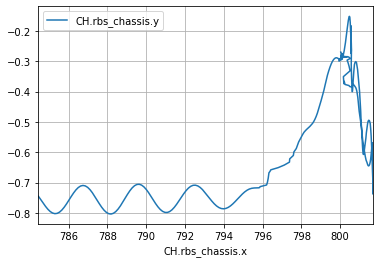

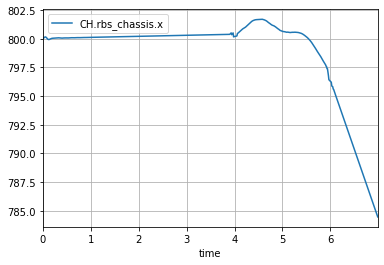

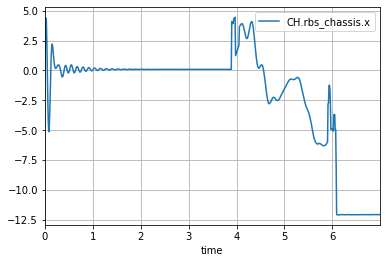

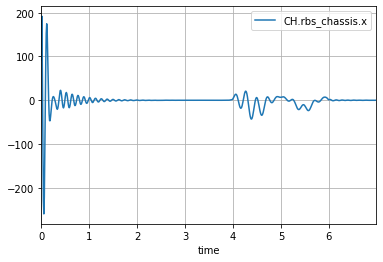

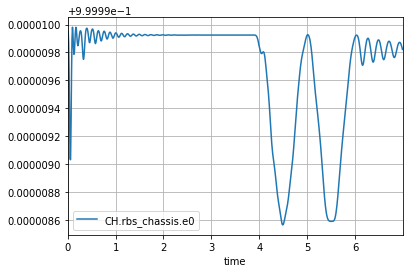

...

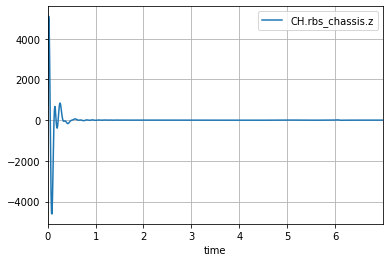

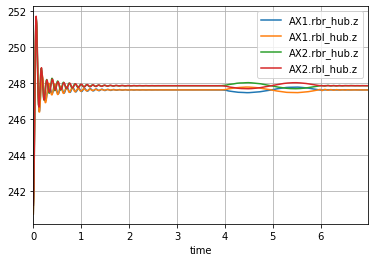

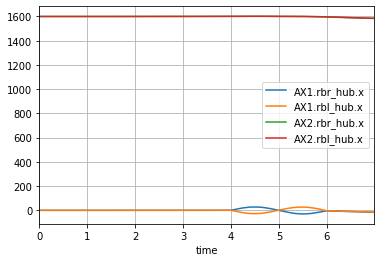

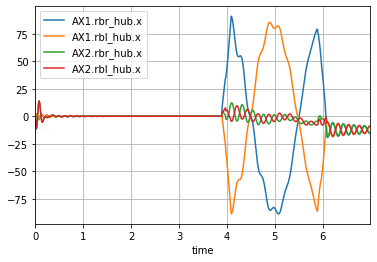

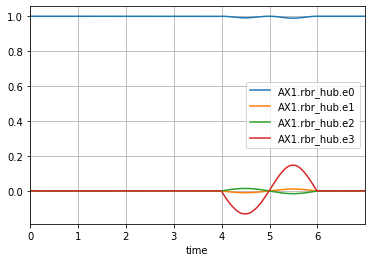

In [30]:
#=============================================================================
#                       Plotting Simulation Results
# =============================================================================
sim.soln.pos_dataframe.plot(x='CH.rbs_chassis.x', y='CH.rbs_chassis.y', grid=True)

sim.soln.pos_dataframe.plot(x='time', y='CH.rbs_chassis.x', grid=True)
sim.soln.vel_dataframe.plot(x='time', y='CH.rbs_chassis.x', grid=True)
sim.soln.acc_dataframe.plot(x='time', y='CH.rbs_chassis.x', grid=True)

sim.soln.pos_dataframe.plot(x='time', y='CH.rbs_chassis.e0', grid=True)
sim.soln.pos_dataframe.plot(x='time', y='CH.rbs_chassis.e1', grid=True)
sim.soln.pos_dataframe.plot(x='time', y='CH.rbs_chassis.e2', grid=True)
sim.soln.pos_dataframe.plot(x='time', y='CH.rbs_chassis.e3', grid=True)

sim.soln.pos_dataframe.plot(x='time', y='CH.rbs_chassis.y', grid=True)
sim.soln.pos_dataframe.plot(x='time', y='CH.rbs_chassis.z', grid=True)

sim.soln.vel_dataframe.plot(x='time', y='CH.rbs_chassis.z', grid=True)
sim.soln.acc_dataframe.plot(x='time', y='CH.rbs_chassis.z', grid=True)


sim.soln.pos_dataframe.plot(x='time', 
                            y=['AX1.rbr_hub.z', 'AX1.rbl_hub.z',
                               'AX2.rbr_hub.z', 'AX2.rbl_hub.z'], 
                            grid=True)

sim.soln.pos_dataframe.plot(x='time', 
                            y=['AX1.rbr_hub.x', 'AX1.rbl_hub.x',
                               'AX2.rbr_hub.x', 'AX2.rbl_hub.x'], 
                            grid=True)

sim.soln.vel_dataframe.plot(x='time', 
                            y=['AX1.rbr_hub.x', 'AX1.rbl_hub.x',
                               'AX2.rbr_hub.x', 'AX2.rbl_hub.x'], 
                            grid=True)

sim.soln.pos_dataframe.plot(x='time', 
                            y=['AX1.rbr_hub.e0', 'AX1.rbr_hub.e1',
                               'AX1.rbr_hub.e2', 'AX1.rbr_hub.e3'], 
                            grid=True)
